In [3]:
import torch
from diffusers import StableDiffusionPipeline, UNet2DConditionModel
from PIL import Image
import matplotlib.pyplot as plt
import os

In [6]:
gpu_id = 1  
os.environ["CUDA_VISIBLE_DEVICES"] = str(gpu_id)

# Check available GPU memory before loading models
if torch.cuda.is_available():
    print(f"Using GPU: {torch.cuda.get_device_name()}")
    print(f"Total GPU memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
    print(f"Available GPU memory: {torch.cuda.memory_allocated(0) / 1e9:.2f} GB used, {torch.cuda.memory_reserved(0) / 1e9:.2f} GB reserved")
else:
    print("CUDA not available, using CPU")

# Set optimization parameters
torch_dtype = torch.float16  # Use half precision
enable_attention_slicing = True

# Define inference parameters
inference_steps = 30  # Lower value = less memory usage
guidance_scale = 7.5

# Load original model
print("Loading original model...")
original_pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", 
    torch_dtype=torch_dtype,
    low_cpu_mem_usage=True
)
original_pipe = original_pipe.to("cuda")

# Enable memory optimizations for original model
if enable_attention_slicing:
    original_pipe.enable_attention_slicing()
    print("Enabled attention slicing for original model")

# Load fine-tuned model
print("Loading fine-tuned model...")
fine_tuned_pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    torch_dtype=torch_dtype,
    low_cpu_mem_usage=True
)

# Enable memory optimizations for fine-tuned model
if enable_attention_slicing:
    fine_tuned_pipe.enable_attention_slicing()
    print("Enabled attention slicing for fine-tuned model")

# Replace UNet with fine-tuned version
print("Loading fine-tuned UNet...")
fine_tuned_pipe.unet = UNet2DConditionModel.from_pretrained(
    "dinaaaaaa/flickr30k-fine-tuned-unet",
    torch_dtype=torch_dtype
)
fine_tuned_pipe = fine_tuned_pipe.to("cuda")


Using GPU: NVIDIA RTX A5000
Total GPU memory: 25.42 GB
Available GPU memory: 4.34 GB used, 6.15 GB reserved
Loading original model...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Enabled attention slicing for original model
Loading fine-tuned model...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Enabled attention slicing for fine-tuned model
Loading fine-tuned UNet...


In [7]:
# Test prompt list
test_prompts = [
    "A person walking on the beach",
    "A cat sitting on a windowsill",
    "People on a city street",
    "A cabin in the mountains",
    "A person reading a book"
]

# Generate and compare images
def compare_models(prompts):
    for i, prompt in enumerate(prompts):
        print(f"Processing prompt {i+1}/{len(prompts)}: '{prompt}'")
        
        # Clear CUDA cache between generations
        torch.cuda.empty_cache()
        
        # Set random seed to ensure comparability
        generator = torch.Generator(device="cuda").manual_seed(42)
        
        try:
            # Generate image with original model
            print("Generating image with original model...")
            original_image = original_pipe(
                prompt, 
                guidance_scale=guidance_scale, 
                num_inference_steps=inference_steps,
                generator=generator
            ).images[0]
            
            # Clear CUDA cache between generations
            torch.cuda.empty_cache()
            
            # Reset generator seed
            generator = torch.Generator(device="cuda").manual_seed(42)
            
            # Generate image with fine-tuned model
            print("Generating image with fine-tuned model...")
            fine_tuned_image = fine_tuned_pipe(
                prompt, 
                guidance_scale=guidance_scale, 
                num_inference_steps=inference_steps,
                generator=generator
            ).images[0]
            
            # Display results
            plt.figure(figsize=(16, 8))
            
            plt.subplot(1, 2, 1)
            plt.imshow(original_image)
            plt.title("Original Model")
            plt.axis("off")
            
            plt.subplot(1, 2, 2)
            plt.imshow(fine_tuned_image)
            plt.title("Fine-tuned Model")
            plt.axis("off")
            
            plt.suptitle(f"Prompt: '{prompt}'", fontsize=16)
            plt.tight_layout()
            plt.show()
            
            # Save images
            original_image.save(f"comparison_{i}_original.png")
            fine_tuned_image.save(f"comparison_{i}_fine_tuned.png")
            
            print(f"Saved comparison images for prompt {i+1}/{len(prompts)}")
            
        except RuntimeError as e:
            print(f"Error generating images for prompt: '{prompt}'")
            print(f"Error details: {e}")
            print("Trying to free up memory and continue with next prompt...")
            
        # Clear cache again
        torch.cuda.empty_cache()

Starting comparison...
Processing prompt 1/5: 'A person walking on the beach'
Generating image with original model...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating image with fine-tuned model...


  0%|          | 0/30 [00:00<?, ?it/s]

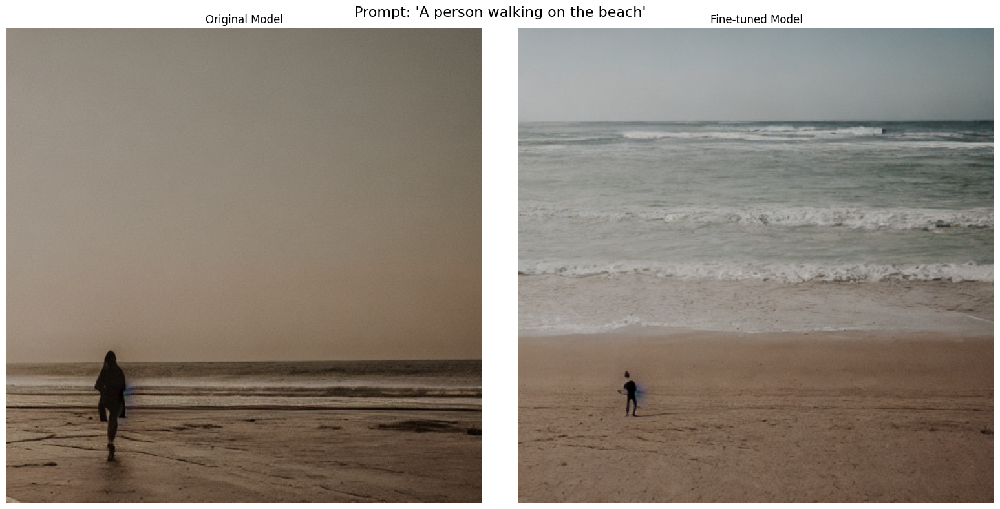

Saved comparison images for prompt 1/5
Processing prompt 2/5: 'A cat sitting on a windowsill'
Generating image with original model...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating image with fine-tuned model...


  0%|          | 0/30 [00:00<?, ?it/s]

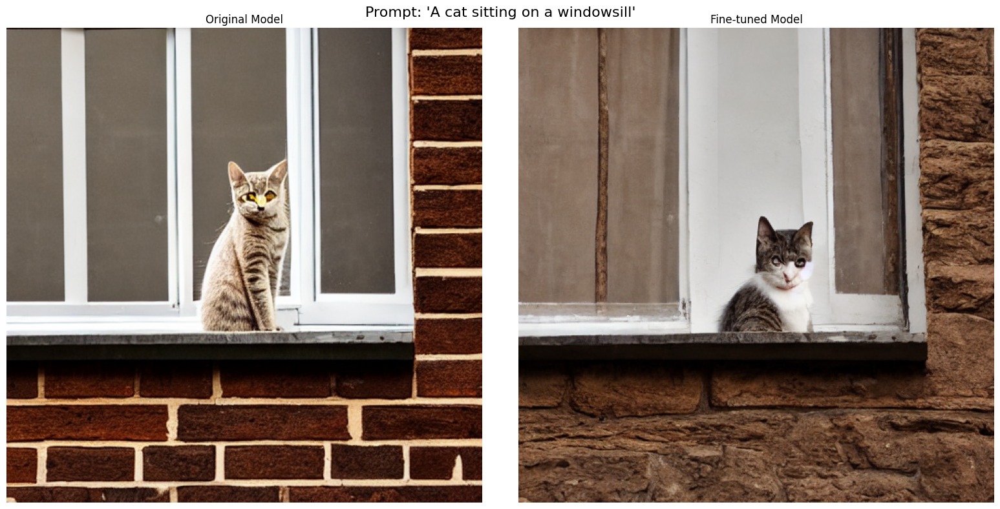

Saved comparison images for prompt 2/5
Processing prompt 3/5: 'People on a city street'
Generating image with original model...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating image with fine-tuned model...


  0%|          | 0/30 [00:00<?, ?it/s]

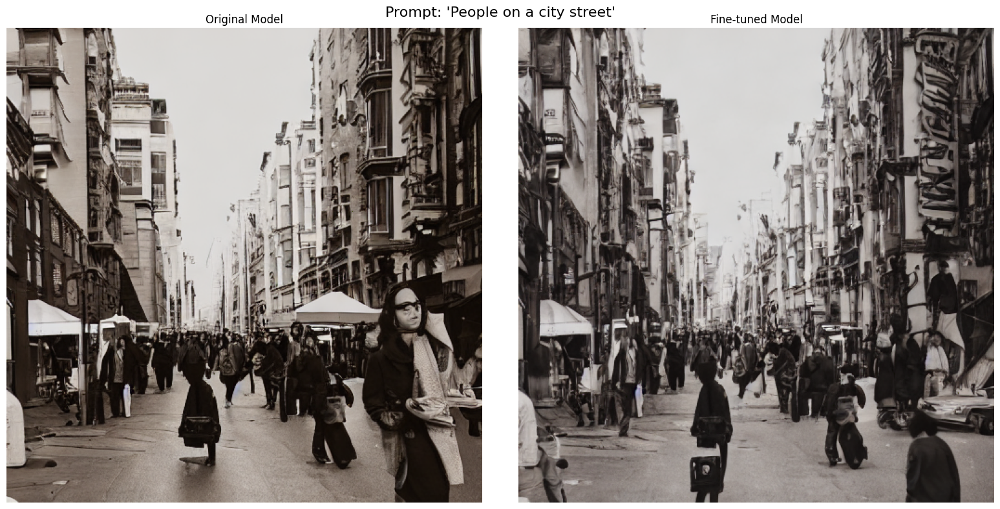

Saved comparison images for prompt 3/5
Processing prompt 4/5: 'A cabin in the mountains'
Generating image with original model...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating image with fine-tuned model...


  0%|          | 0/30 [00:00<?, ?it/s]

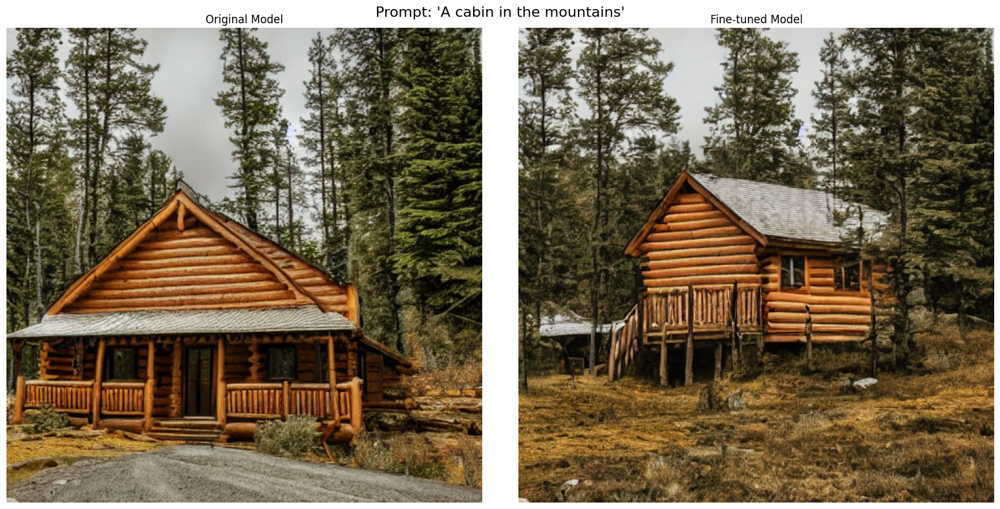

Saved comparison images for prompt 4/5
Processing prompt 5/5: 'A person reading a book'
Generating image with original model...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating image with fine-tuned model...


  0%|          | 0/30 [00:00<?, ?it/s]

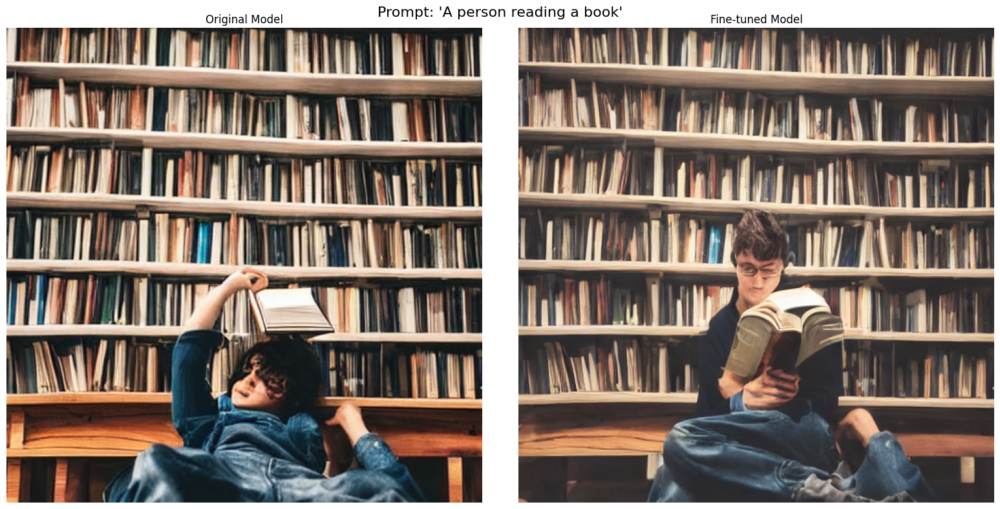

Saved comparison images for prompt 5/5


In [8]:
print("Starting comparison...")
compare_models(test_prompts)